### Классификация по тональности
В этом домашнем задании вам предстоит классифицировать по тональности отзывы на банки с сайта banki.ru.

Данные содержат непосредственно тексты отзывов, некоторую дополнительную информацию, а также оценку по шкале от 1 до 5.

Тексты хранятся в json-ах в массиве responses.

Посмотрим на примере отзыва: возьмите для удобства ноутбук, размещенный в папке репозитория.


### Часть 1. Анализ текстов
1. Посчитайте количество отзывов в разных городах и на разные банки
2. Постройте гистограмы длин слов в символах и в словах
3. Найдите 10 самых частых:
- слов
- слов без стоп-слов
- лемм
- существительных

4. Постройте кривые Ципфа и Хипса
5. Ответьте на следующие вопросы:
- какое слово встречается чаще, "сотрудник" или "клиент"?
- сколько раз встречается слова "мошенничество" и "доверие"?

6. В поле "rating_grade" записана оценка отзыва по шкале от 1 до 5. Используйте меру $tf-idf$, для того, чтобы найти ключевые слова и биграмы для положительных отзывов (с оценкой 5) и отрицательных отзывов (с оценкой 1)

### Часть 2. Тематическое моделирование
1. Постройте несколько тематических моделей коллекции документов с разным числом тем. Приведите примеры понятных (интерпретируемых) тем.
2. Найдите темы, в которых упомянуты конкретные банки (Сбербанк, ВТБ, другой банк). Можете ли вы их прокомментировать / объяснить?
Эта часть задания может быть сделана с использованием gensim.

### Часть 3. Классификация текстов
Сформулируем для простоты задачу бинарной классификации: будем классифицировать на два класса, то есть, различать резко отрицательные отзывы (с оценкой 1) и положительные отзывы (с оценкой 5).

1. Составьте обучающее и тестовое множество: выберите из всего набора данных N1 отзывов с оценкой 1 и N2 отзывов с оценкой 5 (значение N1 и N2 – на ваше усмотрение). Используйте sklearn.model_selection.train_test_split для разделения множества отобранных документов на обучающее и тестовое.
2. Используйте любой известный вам алгоритм классификации текстов для решения задачи и получите baseline. Сравните разные варианты векторизации текста: использование только униграм, пар или троек слов или с использованием символьных $n$-грам.
3. Сравните, как изменяется качество решения задачи при использовании скрытых тем в качестве признаков:
- 1-ый вариант: $tf-idf$ преобразование (sklearn.feature_extraction.text.TfidfTransformer) и сингулярное разложение (оно же – латентый семантический анализ) (sklearn.decomposition.TruncatedSVD),
- 2-ой вариант: тематические модели LDA (sklearn.decomposition.LatentDirichletAllocation).
Используйте accuracy и F-measure для оценки качества классификации.

В ноутбуке, размещенном в папке репозитория. написан примерный Pipeline для классификации текстов.

Эта часть задания может быть сделана с использованием sklearn.


In [1]:
import json
import os

import bz2  # for compressing the data
import regex
from tqdm import tqdm
from scipy import sparse
import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
# %pylab inline

from beholder import print_methods, check_na

##### Loading data


In [2]:
%%time
responses = []          # list of responses (dicts)
with bz2.BZ2File('/Users/velo1/SynologyDrive/GIT_syno/data/NLP/banki_responses.json.bz2', 'r') as thefile:
    for row in tqdm(thefile):
        resp = json.loads(row)  # convert from string to dict

        if not resp['rating_not_checked'] and (len(resp['text'].split()) > 0):
            responses.append(resp)  # add only non-empty responses and checked by moderators

os.system(f'say "{len(responses)} rows have successfully been read."')

201030it [00:59, 3360.32it/s]


CPU times: user 58.9 s, sys: 803 ms, total: 59.7 s
Wall time: 1min 5s


0

In [3]:
responses[0]

{'city': 'г. Москва',
 'rating_not_checked': False,
 'title': 'Жалоба',
 'num_comments': 0,
 'bank_license': 'лицензия № 2562',
 'author': 'uhnov1',
 'bank_name': 'Бинбанк',
 'datetime': '2015-06-08 12:50:54',
 'text': 'Добрый день! Я не являюсь клиентом банка и поручителем по кредитному договору, а также не являюсь каким-либо другим лицом, письменно  оформившим отношения с банком по поводу урегулирования чьей-либо  задолженности.  Начиная с марта 2015 года начали приходить бесконечные письма из ООО "Примо коллект"на мой адрес: город Москва, Уваровский переулок, дом 10, квартира 111, с угрозами о возбуждении уголовного дела в отношении гражданина Филиппова Эдуарда Владимировича, который уклоняется от уплаты взятых им кредитов: договор № 81014 от 20.10.2013 года и договор № 2464946 от 09.10.2014 года. Со всей ответственностью\xa0 хочу Вас заверить, что вышеуказанный гражданин, которого Вы разыскиваете, мне не знаком и никогда в моем адресе не был зарегистрирован. Каким образом Вы не удо

In [4]:
data = pd.DataFrame(responses)

## Text Analysys

#### Top-20 cities by number of banki.ru reviews

In [5]:
grouped_city = (
    data.groupby("city")
    .count()
    .sort_values(by="num_comments", ascending=False)
    .head(20)
)

fig = px.bar(
    grouped_city["num_comments"],
    # x=grouped_city.index,
    y="num_comments",
    title="Города с наибольшим количеством отзывов",
    width=1000,
    height=600,
    text_auto=True,
    color=grouped_city["num_comments"],
    color_continuous_scale="darkmint",
)
# fig.update_xaxes(autorange="reversed")

fig.update_layout(
    yaxis_title="Количество отзывов", xaxis_title="Город", showlegend=False
)
fig.update_coloraxes(showscale=False)
fig.show()

#### Top-20 banks by number of comments

In [6]:
grouped_banks = (
    data.groupby("bank_name")
    .count()
    .sort_values(by="num_comments", ascending=False)
    .head(20)
)

fig = px.bar(
    grouped_banks,
    # x=grouped_banks.index,
    y="num_comments",
    title="Количество отзывов по банкам",
    text_auto=True,
    hover_data=["num_comments"],
    color=grouped_banks["num_comments"],
    color_continuous_scale="darkmint",
    height=800,
)
fig.update_xaxes(tickangle=45, title_text="Банк")
fig.update_yaxes(title_text="Количество отзывов")
fig.update_coloraxes(showscale=False)

fig.show()

#### Top-10 most frequent words before removing stop-words

In [7]:
from gensim.corpora import Dictionary  # for creating dictionary from a list of texts
from nltk.tokenize import word_tokenize  # for tokenizing text into words (tokens)
from string import punctuation  # for removing punctuation

# Tokenize each text and filter out punctuation tokens
texts = [
    [token.lower() for token in word_tokenize(text) if token not in punctuation]
    for text in tqdm(data.text, desc="Tokenizing texts")
]
# Create a dictionary from the texts
dictionary = Dictionary(texts)  # texts should be list of tokenized lists
print("Top-10 tokens before removing stopwords:")
os.system("say 'Done'")
dictionary.most_common(10)

Tokenizing texts: 100%|██████████| 153499/153499 [05:00<00:00, 511.18it/s] 


Top-10 tokens before removing stopwords:


[('в', 1322516),
 ('и', 1054485),
 ('не', 851742),
 ('на', 704396),
 ('что', 621783),
 ('я', 573896),
 ('с', 454545),
 ('по', 365188),
 ('мне', 320695),
 ('банка', 263957)]

### Histogramm of the length of the reviews

In [8]:
# Get the top-10 longest words from the dictionary
# sorts the keys (words) in the dictionary.token2id dictionary based on their length
result = sorted(dictionary.token2id.keys(), key=lambda x: len(x), reverse=True)
print("Top-10 longest words in the dictionary:")
result[:3]

Top-10 longest words in the dictionary:


['//rencredit.ru/media/504197/tarify_dopolnitelnogo_voznagrazhdenija_za_polzovanie_kartoj_kb_renessans_kredit_ooo_na_period_s_01.09.2014_po_30.09.2014.pdf',
 '//www.mosproc.ru/news/nagatinskaya/po_initsiative_nagatinskoy_mezhrayonnoy_prokuratury_vozbuzhdeno_ugolovnoe_delo_o_moshennichestve_pri/',
 '//www.fma.govt.nz/news/warnings-and-alerts/fma-warning-notices-and-alerts/warning-beware-of-forex-trend-limited-and-fx-trend-com/']

In [9]:
data_ = pd.DataFrame(result, columns=["token"])  # convert list to dataframe
data_["token_len"] = data_["token"].apply(lambda x: len(x))  # add token length column
fig = px.histogram(
    data_,
    x="token_len",
    title="Distribution of token length",
    text_auto=True,
    height=500,
)
# add axis labels
fig.update_layout(
    xaxis_title="Token length",
    yaxis_title="Number of tokens, log",
    font=dict(size=10),
)
fig.update_yaxes(type="log")
# mark median
fig.add_vline(
    x=data_["token_len"].median() - 1, line_width=1, line_dash="dash", line_color="red"
)
val_ = data_["token_len"].median() - 1
fig.add_annotation(
    x=val_,
    y=1,
    text=f"median={val_:.0f}",
)
fig.show()

In [10]:
# plot distribution of reviews length
data_ = pd.DataFrame([len(x) for x in data["text"]], columns=["review_length"])
# data_['review_length'] = data_['text'].apply(lambda x: len(x.split()))
fig = px.histogram(
    data_,
    x="review_length",
    title="Distribution of reviews length",
    text_auto=True,
    height=500,
)
fig.update_xaxes(range=[0, 5000])
fig.show()

#### Top-10 most frequent words excluding stopwords

#### pymorphy2 (for russian words lemmatization)


In [11]:
from nltk.corpus import stopwords
from string import punctuation
try:
    import ipywidgets
except:
    !python -m pip install ipywidgets
    import ipywidgets
from tqdm.auto import tqdm
import re
import nltk
from nltk.tokenize import word_tokenize
import os


tqdm.pandas()   # enable the integration of the tqdm progress bar with Pandas operation
nltk.download('stopwords')

try:
    import pymorphy2
except ImportError:
    !python -m pip install pymorphy2
    import pymorphy2

morph = pymorphy2.MorphAnalyzer()


mystopwords = stopwords.words("russian") + [
    "это", "наш", "тыс", "млн", "млрд", "также", "т", "д", "который", "прошлый",
    "сей", "свой", "наш", "мочь", "такой", "-"
]
regex_pattern = re.compile(r"[^А-Яа-яёЁA-Zaz ]")
def preprocess_text(text):
    try:
        text_ = re.sub(regex_pattern, "", text)
        words = text_.lower().split()
        # words = [token.lower() for token in word_tokenize(text) if token not in punctuation]
        lemmatized_words = [morph.parse(word)[0].normal_form for word in words]
        # change "банка" to "банк"
        lemmatized_words = ['банк' if word == 'банка' else word for word in lemmatized_words]
        filtered_words = [word for word in lemmatized_words if word not in mystopwords and word not in punctuation]
        return " ".join(filtered_words)
    except:
        return ""


[nltk_data] Downloading package stopwords to /Users/velo1/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [12]:
morph.parse("банку")[1].normal_form  # the second most probable parsing

'банк'

In [13]:
file_ = "data/banki_preproc.csv"
if not os.path.exists(file_):
    # process data and save to csv
    data["tokens"] = data["text"].astype("str").progress_apply(preprocess_text)
    # os.makedirs('data')
    data.to_csv(file_, index=False)
else:
    data = pd.read_csv(file_)

os.system(f'say "File {file_} is ready"')

data.head(3)

,city,rating_not_checked,title,num_comments,bank_license,author,bank_name,datetime,text,rating_grade,tokens
0,г. Москва,False,Жалоба,0,лицензия № 2562,uhnov1,Бинбанк,2015-06-08 12:50:54,Добрый день! Я не являюсь клиентом банка и пор...,NaN,добрый день являться клиент банк поручитель кр...
1,г. Новосибирск,False,Не могу пользоваться услугой Сбербанк он-лайн,0,лицензия № 1481,Foryou,Сбербанк России,2015-06-08 11:09:57,Доброго дня! Являюсь держателем зарплатной кар...,NaN,добрый день являться держатель зарплатный карт...
2,г. Москва,False,Двойное списание за один товар.,1,лицензия № 2562,Vladimir84,Бинбанк,2015-06-05 20:14:28,Здравствуйте! Дублирую свое заявление от 03.0...,NaN,здравствовать дублировать заявление можайский ...


In [14]:
texts = [text.split() for text in data.tokens]
dictionary_wsw = Dictionary(texts)
print("Top-10 tokens after removing stopwords:")
dictionary_wsw.most_common(10)

Top-10 tokens after removing stopwords:


[('банк', 624158),
 ('карта', 331831),
 ('весь', 253560),
 ('деньга', 178323),
 ('день', 169238),
 ('год', 158757),
 ('кредит', 154776),
 ('отделение', 143576),
 ('счёт', 140478),
 ('сотрудник', 133563)]

####  pymystem3 (5 times slower then pymorphy2)

In [15]:
from pymystem3 import Mystem

mystem_analyzer = Mystem()


def preprocess_text_pymystem(text):
    try:
        text_ = re.sub(regex_pattern, "", text)
        # words = text_.lower().split() # simple split by space
        words = [
            token.lower() for token in word_tokenize(text) if token not in punctuation
        ]
        lemmatized_words = [mystem_analyzer.lemmatize(word) for word in words]
        # change "банка" to "банк"
        lemmatized_words = [
            "банк" if word == "банка" else word for word in lemmatized_words
        ]
        filtered_words = [
            word
            for word in lemmatized_words
            if word not in mystopwords and word not in punctuation
        ]
        return " ".join(filtered_words)
    except:
        return ""

In [16]:
%%time
# data['tokens'] = data['text'].astype('str').progress_map(preprocess_text_pymystem)
# data.sample(3)

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 6.91 µs


### Top-20 most frequent nouns

In [17]:
try:
    from wordcloud import WordCloud
except:
    !python -m pip install wordcloud
    from wordcloud import WordCloud

cnt = 0
list_of_words = []
# search for top-20 nouns in the 300 most common words in the dictionary
for word in dictionary_wsw.most_common(300):
    if morph.parse(word[0])[0].tag.POS == "NOUN":   # POS - Part of Speech
        print(word[0], word[1])
        list_of_words.append(word[0])
        cnt += 1
        if cnt == 20:
            break

банк 624158
карта 331831
деньга 178323
день 169238
год 158757
кредит 154776
отделение 143576
счёт 140478
сотрудник 133563
клиент 132919
сумма 110850
заявление 103014
рубль 99782
вопрос 97031
время 94098
ответ 76739
платёж 76577
вклад 75841
телефон 74806
офис 73285


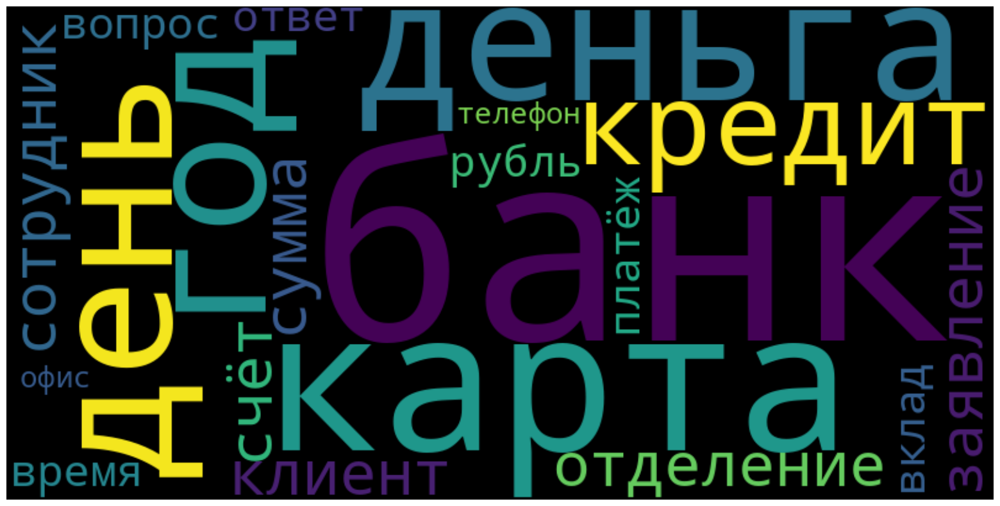

In [18]:
wordcloud = WordCloud(width=800, height=400).generate(" ".join(list_of_words))
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

### Determining the number of occurrences of certain words in the entire corpus

In [19]:
def num_occurences(word: str, dictionary) -> int:
    """Returns the number of occurences of a word in a gensim.corpora.Dictionary"""
    try:
        index_ = dictionary.token2id[word]

        print(f"Word {word:<15} occurs {dictionary.cfs[index_]} times")
        return dictionary.cfs[index_]
    except:
        print(f"Word {word} does not occur in the dictionary")
        return 0

In [20]:
for word_ in ["сотрудник", "клиент", "мошенничество", "доверие"]:
    num_occurences(word_, dictionary_wsw)

Word сотрудник       occurs 133563 times
Word клиент          occurs 132919 times
Word мошенничество   occurs 3221 times
Word доверие         occurs 2101 times


In [21]:
data_ = pd.DataFrame(dictionary_wsw.most_common(300), columns=["text", "count"])
fig = px.line(
    data_,
    x="text",
    y="count",
    title="Word count distribution",
    width=800,
    height=500,
)
fig.update_traces(marker=dict(size=1))
fig.update_coloraxes(showscale=False)
fig.update_xaxes(tickangle=45)
fig.show()

In [22]:
from collections import Counter  # for counting

cnt = Counter()
n_words = []
n_tokens = []
tokens = []
for index, row in tqdm(data.iterrows(), total=len(data)):
    tokens = word_tokenize(row["text"])  # tokenize text
    # Update the counter with the iterable 'tokens'
    cnt.update([token for token in tokens if token not in punctuation])
    n_words.append(len(cnt))  # number of unique tokens (words)
    n_tokens.append(sum(cnt.values()))  # number of tokens
os.system("say 'Token frequency matrix has done'")

  0%|          | 0/153499 [00:00<?, ?it/s]

In [ ]:
data_ = pd.DataFrame({"tokens": n_tokens, "words": n_words})
fig = px.line(
    data_,
    x="tokens",
    y="words",
    title="The dependancy of the number of words on the number of tokens",
    height=600,
)
fig.show()

## Topic modeling

### Часть 2. Тематическое моделирование
1. Постройте несколько тематических моделей коллекции документов с разным числом тем. Приведите примеры понятных (интерпретируемых) тем.
2. Найдите темы, в которых упомянуты конкретные банки (Сбербанк, ВТБ, другой банк). Можете ли вы их прокомментировать / объяснить?
Эта часть задания может быть сделана с использованием gensim.

In [ ]:
from gensim.models import lsimodel  # for LSA (Latent Semantic Analysis), LSI (Latent Semantic Indexing)
from gensim.models import TfidfModel  # for creating tf-idf model
from gensim import similarities  # for creating similarity matrix

corpus_bow = [
    dictionary_wsw.doc2bow(text.split()) for text in data.tokens
]  # create corpus (list) of words in texts
tfidf = TfidfModel(corpus_bow)  # initialize a tf-idf model
print_methods(tfidf)
corpus_tfidf = tfidf[corpus_bow]  # retrieve the tf-idf scores for a whole corpus
# (each document is represented by its TF-IDF weights)

In [ ]:
results = {}
for topic_num in [3,5,10]:
    results[topic_num]= lsimodel.LsiModel(
    corpus=corpus_tfidf, id2word=dictionary_wsw, num_topics=topic_num
)  # initialize an LSI transformation

os.system("say 'Latent Semantic Indexing has finished'")


In [ ]:
results[3].show_topics(
    num_topics=-1, num_words=15, log=True, formatted=False
)  # Significant words for a case of dividing corpus into 3 topics

In [ ]:
topic_num = 10
for theme in range(topic_num):
    print(
        results[topic_num].show_topic(
            theme,
            topn=15,
        )
    )  # print 15 important words in a case of dividing corpus into 'topic_num' topics

In [ ]:
results[3].show_topics()

In [ ]:
search_list = ["Сбербанк".lower(), "ВТБ".lower()]
for topic_no in results.keys():
    for el in results[topic_no].show_topics(formatted=False, num_words=15):
        for tuple_ in el[1]:
            if tuple_[0] in search_list and  abs(tuple_[1]) > 0.1:
                print(f'Topic:{topic_no} {tuple_}')

In [ ]:
 print(f'Topic 0{" "*25}Topic 2')
 for el in zip(results[3].show_topic(0, topn=15, ),results[5].show_topic(2, topn=15, )) :
    print(f'{el[0][0]:<15}: {el[0][1]:.02f}\t\t{el[1][0]:<15}: {el[1][1]:.02f}')


* В первом топике идет речь о проблемах, связанных с погашением микрозаймов в "Деньга" через  отделения Сбербанка и общением с их сотрудниками по вопросам кредитования и вкладов
* Во втором топике идет речь о проблемах, связанных с работой банкоматов Сбербанка 

## Классификация текстов
Сформулируем для простоты задачу бинарной классификации: будем классифицировать на два класса, то есть, различать резко отрицательные отзывы (с оценкой 1) и положительные отзывы (с оценкой 5).

1. Составьте обучающее и тестовое множество: выберите из всего набора данных N1 отзывов с оценкой 1 и N2 отзывов с оценкой 5 (значение N1 и N2 – на ваше усмотрение). Используйте sklearn.model_selection.train_test_split для разделения множества отобранных документов на обучающее и тестовое.
2. Используйте любой известный вам алгоритм классификации текстов для решения задачи и получите baseline. Сравните разные варианты векторизации текста: использование только униграм, пар или троек слов или с использованием символьных $n$-грам.
3. Сравните, как изменяется качество решения задачи при использовании скрытых тем в качестве признаков:
- 1-ый вариант: $tf-idf$ преобразование (sklearn.feature_extraction.text.TfidfTransformer) и сингулярное разложение (оно же – латентый семантический анализ) (sklearn.decomposition.TruncatedSVD),
- 2-ой вариант: тематические модели LDA (sklearn.decomposition.LatentDirichletAllocation).
Используйте accuracy и F-measure для оценки качества классификации.

В ноутбуке, размещенном в папке репозитория. написан примерный Pipeline для классификации текстов.

Эта часть задания может быть сделана с использованием sklearn.

In [ ]:
check_na(data, dtype_sort=False)

In [ ]:
# remove nan values from the dataset
# data = data.dropna()
df = data.dropna(subset=['rating_grade', 'city', 'title'])
# data = data.reset_index(drop=True)
df.head()


In [ ]:
df.info()

##### 'rating_grade' and 'tokens' do not contain nan values

In [ ]:
# filter datafreame on 'rating_grade' column
# df = data[data['rating_grade'].isin([1,2,5])]
data['rating'] = data['rating_grade'].apply(0 if x == 1 else (1 if x == 5 else np.nan))
df = data[['tokens','rating']]
df.head()

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
# This class is a combination of CountVectorizer and TfidfTransformer. 
#It first applies tokenization and word counting using CountVectorizer 
# #and then transforms the counts into TF-IDF values using TfidfTransformer.
from sklearn.svm import SVC
from sklearn.decomposition import TruncatedSVD
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import  train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix


# Split the data into train and test sets
train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)

X_train = train_data['tokens']
y_train = train_data['rating']

# !!! На каждом этапе Pipeline нужно указать свои параметры
# 1-ый вариант: tf-idf + LSI
# 2-ой вариант: LDA

# clf = Pipeline([
#     ('vect', CountVectorizer(analyzer = 'char', ngram_range={4,6})),
#     ('clf', RandomForestClassifier()),
# ])
results = {}
for ngram in [(1,1),(1,2),(2,2),(1,3),(2,3),(3,3)]:
    clf = Pipeline(
        [
            # ("vect", CountVectorizer()),
            # ("tfidf", TfidfTransformer()),
            ("tfidf", TfidfVectorizer(max_features=10000, ngram_range=ngram)),
            ("tm", TruncatedSVD(n_components=300, random_state=42)),
            ("clf", RandomForestClassifier(n_estimators=100, random_state=42)),
        ]
    )

    clf.fit(X_train, y_train)
    predictions = clf.predict(test_data['tokens'])
    # print(ngram)
    # print(classification_report(test_data['rating'], predictions))
    # print(confusion_matrix(test_data['rating'], predictions))
    print(f1_score(test_data['rating'], predictions, average='macro'))
    results[ngram] = {'f1 score':f1_score(test_data['rating'], predictions, average='macro'),
                        'confusion matrix':confusion_matrix(test_data['rating'], predictions)}
    # print(f'{"*"*30}')
    os.system(f'say "n-gram {ngram} is done"')

In [ ]:
clf.get_params()

In [ ]:
# clf[:-1].get_feature_names_out()

In [ ]:
print_methods(clf)

In [ ]:
# text_data = [resp["text"] for resp in responses]
# text_data = [re.sub(r'[^\w\s]','',text_data[i]) for i in range(len(text_data))    ]
# text_data = [re.sub(r'\d+','',text_data[i]) for i in range(len(text_data))    ]
# text_data = [text_data[i].lower() for i in range(len(text_data))    ]
# text_data = [text_data[i].split() for i in range(len(text_data))    ]
# text_data = [list(filter(None, text_data[i])) for i in range(len(text_data))    ]
# text_data = [list(filter(lambda x: x not in stop_words, text_data[i])) for i in range(len(text_data))    ]
# text_data = [list(filter(lambda x: x not in ['nan'], text_data[i])) for i in range(len(text_data))    ]

# len(text_data), text_data[:3]

In [ ]:
# Create a TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=5000)
train_tfidf_matrix = tfidf_vectorizer.fit_transform(train_data['tokens'])
test_tfidf_matrix = tfidf_vectorizer.transform(test_data['tokens'])


In [ ]:
# Define a list of components to try
# components_list = list(range(30, 301, 60))
# components_list = np.logspace(np.log10(30), np.log10(300), 5).astype(int)   
components_list = [300]

# Iterate over different numbers of components
for n_components in components_list:
    # Apply TruncatedSVD
    svd = TruncatedSVD(n_components=n_components)
    train_svd_matrix = svd.fit_transform(train_tfidf_matrix)
    test_svd_matrix = svd.transform(test_tfidf_matrix)
    
    # Train a SVC (Support Vector Classification)
    clf = SVC()
    clf.fit(train_svd_matrix, train_data['rating'])
    
    # Make predictions
    predictions = clf.predict(test_svd_matrix)
    
    # Calculate and print accuracy
    accuracy = accuracy_score(test_data['rating'], predictions)
    print(f'Number of components: {n_components}, Accuracy: {accuracy:.2f}')
    # f1 score
    f1 = f1_score(test_data['rating'], predictions, average='macro')
    print(f'Number of components: {n_components}, F1 score: {f1:.2f}')
    # print out classificaiton report
    print(classification_report(test_data['rating'], predictions))

os.system('say "Long routine has finished"')

In [ ]:
# confusion matrix
from sklearn.metrics import ConfusionMatrixDisplay

cm_dt = confusion_matrix(test_data['rating'], predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_dt, display_labels=['Negative','Positive'])
disp.plot(cmap=plt.cm.gist_yarg_r)
plt.title('Decision Tree Classifier')
plt.show()



In [ ]:
from sklearn.decomposition import LatentDirichletAllocation

# Build LDA Model
lda_model = LatentDirichletAllocation(n_components=10,               # Number of topics
                                        max_iter=10,               # Max learning iterations
                                        learning_method='online',
                                        random_state=42,          # Random state
                                        batch_size=128,            # n docs in each learning iter
                                        evaluate_every = -1,       # compute perplexity every n iters, default: Don't
                                        n_jobs = -1,               # Use all available CPUs
                                        )
# lda_output = lda_model.fit_transform(data_vectorized)


In [ ]:
tfidf_vectorizer = TfidfVectorizer(max_features=5000)
train_tfidf_matrix = tfidf_vectorizer.fit_transform(train_data['tokens'])
test_tfidf_matrix = tfidf_vectorizer.transform(test_data['tokens'])

### Using Latent Dirichlet Allocation (LDA) topics as additional features in a text classification pipeline

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
# from sklearn.decomposition import LatentDirichletAllocation
# from sklearn.svm import SVC
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import accuracy_score


# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(data.tokens, data.rating, test_size=0.2, random_state=42)


##### Convert text data to a document-term matrix using CountVectorizer.

In [ ]:
# Convert text data to document-term matrix using CountVectorizer
vectorizer = CountVectorizer(max_features=1000)
X_train_counts = vectorizer.fit_transform(X_train)


##### Apply LDA to the document-term matrix to extract topics and get topic proportions for each document.

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation

# Apply Latent Dirichlet Allocation (LDA) to learn topics from the document-term matrix
lda_model = LatentDirichletAllocation(n_components=5, random_state=42, learning_method='batch',
                                      n_jobs=-1, verbose=1)
X_train_topics = lda_model.fit_transform(X_train_counts)


##### Combine the LDA topics with the original features to create a combined feature matrix.

In [ ]:
# Combine LDA topics with original features
X_train_combined = X_train_counts.toarray()  # Convert back to array for concatenation
X_train_combined = np.hstack((X_train_combined, X_train_topics))



##### Train a Support Vector Classifier (SVC) on the combined feature matrix.

In [ ]:
# Train a Support Vector Classifier (SVC) using the combined feature matrix
clf = SVC(kernel='linear')
clf.fit(X_train_combined, y_train)



##### Transform test data using the same vectorizer and LDA model.

In [ ]:
# Transform test data using the same vectorizer and LDA model
X_test_counts = vectorizer.transform(X_test)
X_test_topics = lda_model.transform(X_test_counts)
X_test_combined = np.hstack((X_test_counts.toarray(), X_test_topics))


##### Make predictions on the test data using the trained classifier.

In [ ]:
# Make predictions on test data
y_pred = clf.predict(X_test_combined)

# Evaluate the classifier's performance
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
f1 = f1_score(y_test, y_pred)
print(f"F1: {f1:.2f}")


In [ ]:
# clf_lda = Pipeline(
#     [
#         ("vect", CountVectorizer(ngram_range=ngram)),  # Include ngram_range parameter
#         (
#             "tfidf",
#             LatentDirichletAllocation(
#                 n_components=5,
#                 random_state=42,
#                 learning_method="batch",
#                 n_jobs=-1,
#                 verbose=1,
#             ),
#         ),
#         ("clf", RandomForestClassifier(n_estimators=100, random_state=42)),
#     ]
# )